# Keras Regression

In this notebook, we will work with a more realistic data set and focus on feature engineering and cleaning our data.

## The Data

> [kc_house_data.csv](./data/kc_house_data.csv)
>
> The data are from [Kaggle website's House Sales in King County, USA dataset](https://www.kaggle.com/harlfoxem/housesalesprediction). It contains house sale prices for King County, which includes Seattle. It includes homes sold between May 2014 and May 2015.

### Feature Columns

* `id` - Unique ID for each home sold
* `date` - Date of the home sale
* `price` - Price of each home sold
* `bedrooms` - Number of bedrooms
* `bathrooms` - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* `sqft_living` - Square footage of the apartments interior living space
* `sqft_lot` - Square footage of the land space
* `floors` - Number of floors
* `waterfront` - A dummy variable for whether the apartment was overlooking the waterfront or not
* `view` - An index from 0 to 4 of how good the view of the property was
* `condition` - An index from 1 to 5 on the condition of the apartment,
* `grade` - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* `sqft_above` - The square footage of the interior housing space that is above ground level
* `sqft_basement` - The square footage of the interior housing space that is below ground level
* `yr_built` - The year the house was initially built
* `yr_renovated` - The year of the house’s last renovation
* `zipcode` - What zipcode area the house is in
* `lat` - Lattitude
* `long` - Longitude
* `sqft_living15` - The square footage of interior housing living space for the nearest 15 neighbors
* `sqft_lot15` - The square footage of the land lots of the nearest 15 neighbors

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

In [2]:
df = pd.read_csv('./data/kc_house_data.csv')
df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,263000018,5/21/2014,360000.0,3,2.50,1530,1131,3.0,0,0,...,8,1530,0,2009,0,98103,47.6993,-122.346,1530,1509
21593,6600060120,2/23/2015,400000.0,4,2.50,2310,5813,2.0,0,0,...,8,2310,0,2014,0,98146,47.5107,-122.362,1830,7200
21594,1523300141,6/23/2014,402101.0,2,0.75,1020,1350,2.0,0,0,...,7,1020,0,2009,0,98144,47.5944,-122.299,1020,2007
21595,291310100,1/16/2015,400000.0,3,2.50,1600,2388,2.0,0,0,...,8,1600,0,2004,0,98027,47.5345,-122.069,1410,1287


## Exploratory Data Analysis

In [3]:
# Count how many cells containing null - no value filled
df.isnull().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [4]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
id,21597.0,4.580474e+09,2.876736e+09,1.000102e+06,2.123049e+09,3.904930e+09,7.308900e+09,9.900000e+09
price,21597.0,5.402966e+05,3.673681e+05,7.800000e+04,3.220000e+05,4.500000e+05,6.450000e+05,7.700000e+06
bedrooms,21597.0,3.373200e+00,9.262989e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,3.300000e+01
bathrooms,21597.0,2.115826e+00,7.689843e-01,5.000000e-01,1.750000e+00,2.250000e+00,2.500000e+00,8.000000e+00
sqft_living,21597.0,2.080322e+03,9.181061e+02,3.700000e+02,1.430000e+03,1.910000e+03,2.550000e+03,1.354000e+04
sqft_lot,21597.0,1.509941e+04,4.141264e+04,5.200000e+02,5.040000e+03,7.618000e+03,1.068500e+04,1.651359e+06
floors,21597.0,1.494096e+00,5.396828e-01,1.000000e+00,1.000000e+00,1.500000e+00,2.000000e+00,3.500000e+00
waterfront,21597.0,7.547345e-03,8.654900e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
view,21597.0,2.342918e-01,7.663898e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
condition,21597.0,3.409825e+00,6.505456e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00


<Figure size 864x576 with 0 Axes>

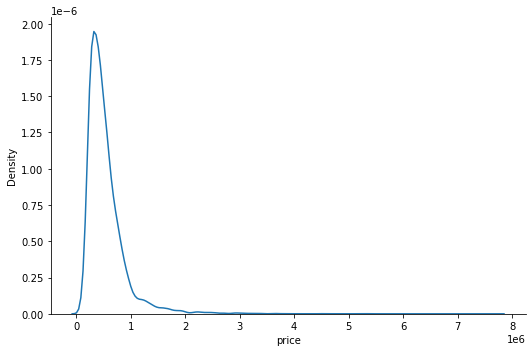

In [5]:
# Vizualize the distribution of 'price'
plt.figure(figsize=(12, 8))
sns.displot(df['price'], kind='kde', aspect=1.5)

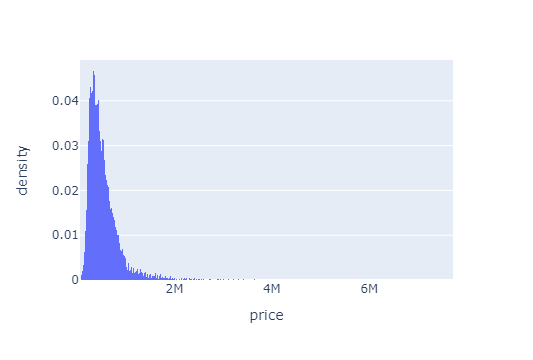

In [6]:
px.histogram(data_frame=df, x='price', histnorm='density')

<AxesSubplot:xlabel='price', ylabel='Count'>

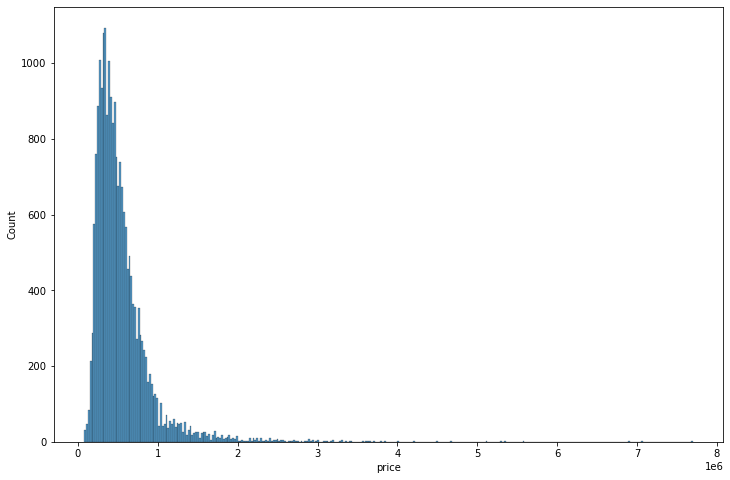

In [7]:
plt.figure(figsize=(12, 8))
sns.histplot(df['price'],)

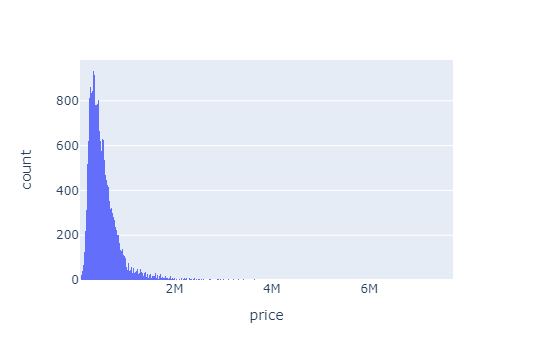

In [8]:
px.histogram(data_frame=df, x='price')

<AxesSubplot:xlabel='bedrooms', ylabel='count'>

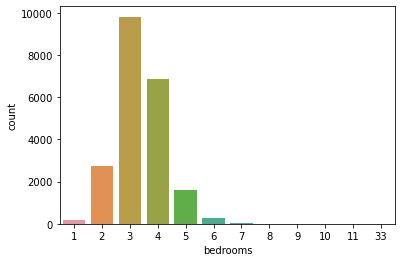

In [9]:
# Create a countplot of bedrooms
sns.countplot(data=df, x='bedrooms')

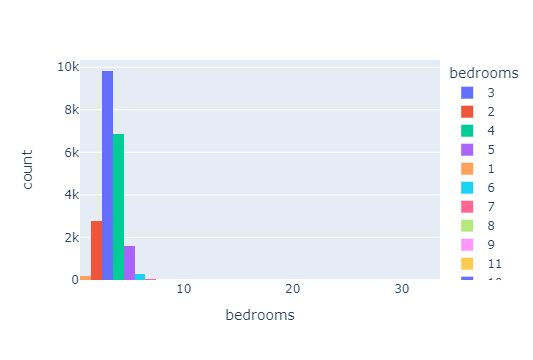

In [10]:
px.histogram(data_frame=df, x='bedrooms', color='bedrooms')

<AxesSubplot:xlabel='price', ylabel='sqft_living'>

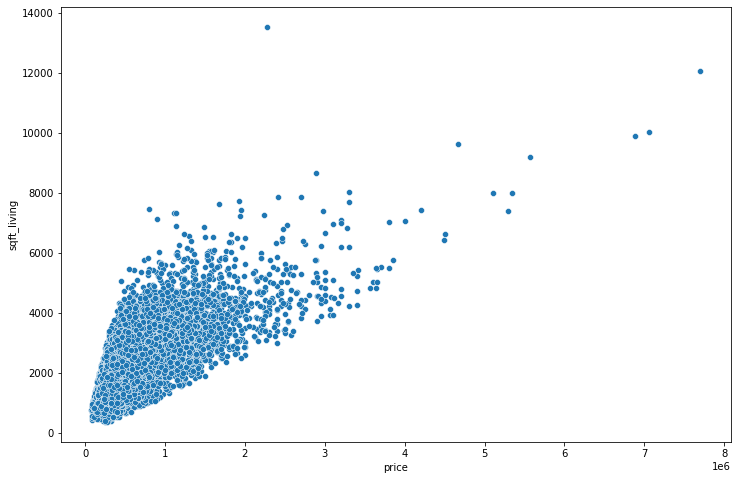

In [11]:
# Visualize relationship between 'price' and 'sqft_living'
plt.figure(figsize=(12, 8))
sns.scatterplot(data=df, x='price', y='sqft_living')

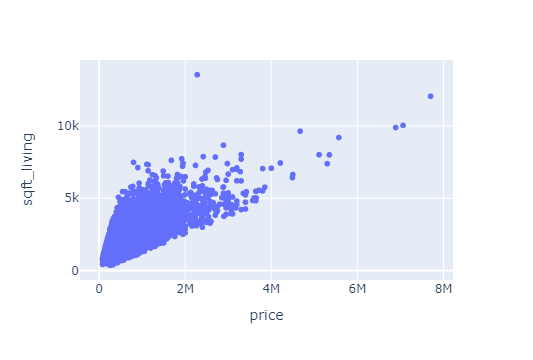

In [12]:
px.scatter(data_frame=df, x='price', y='sqft_living')

<AxesSubplot:xlabel='bedrooms', ylabel='price'>

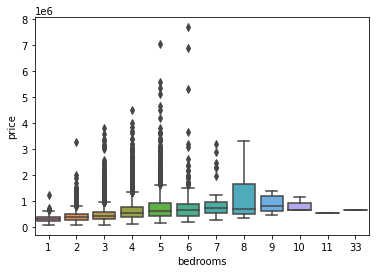

In [13]:
# Create a boxplot showing relationship between 'bedrooms' and 'price'
sns.boxplot(data=df, x='bedrooms', y='price')

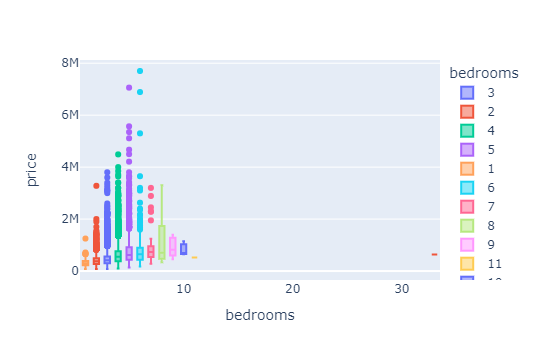

In [14]:
px.box(data_frame=df, x='bedrooms', y='price', color='bedrooms')

### Geographical Properties

<AxesSubplot:xlabel='price', ylabel='long'>

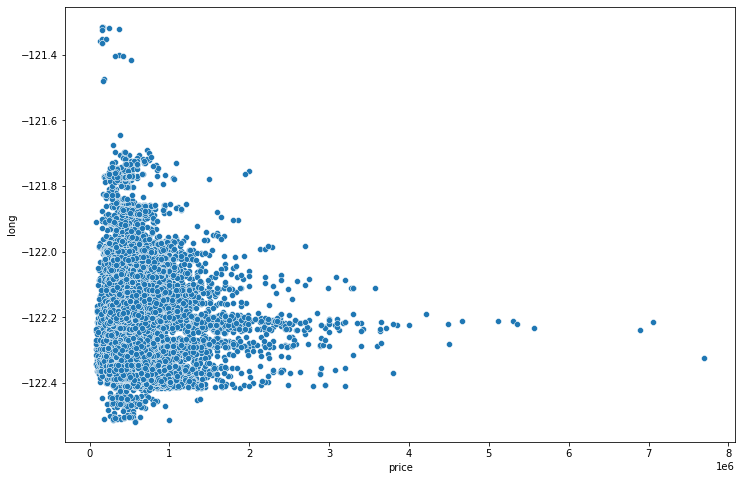

In [15]:
plt.figure(figsize=(12, 8))
sns.scatterplot(data=df, x='price', y='long')

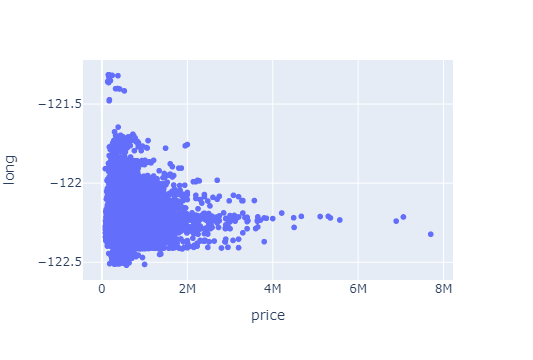

In [16]:
px.scatter(data_frame=df, x='price', y='long')

<AxesSubplot:xlabel='price', ylabel='lat'>

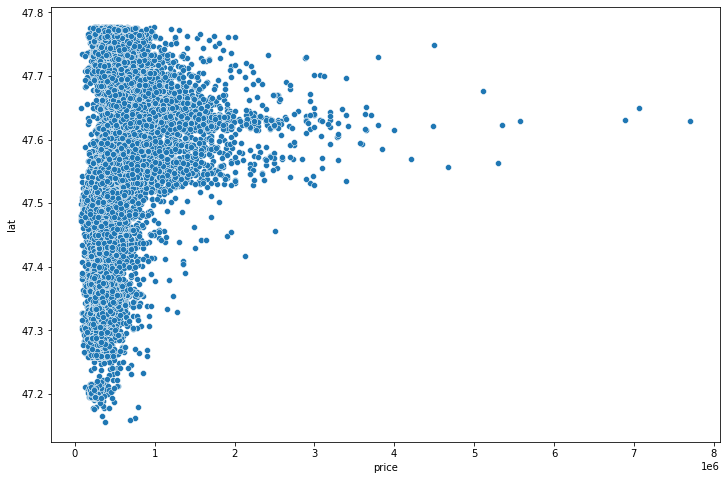

In [17]:
plt.figure(figsize=(12, 8))
sns.scatterplot(data=df, x='price', y='lat')

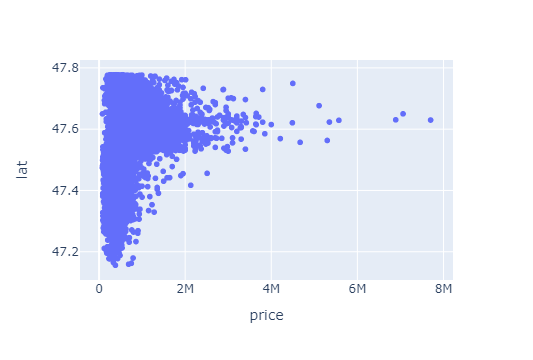

In [18]:
px.scatter(data_frame=df, x='price', y='lat')

<AxesSubplot:xlabel='long', ylabel='lat'>

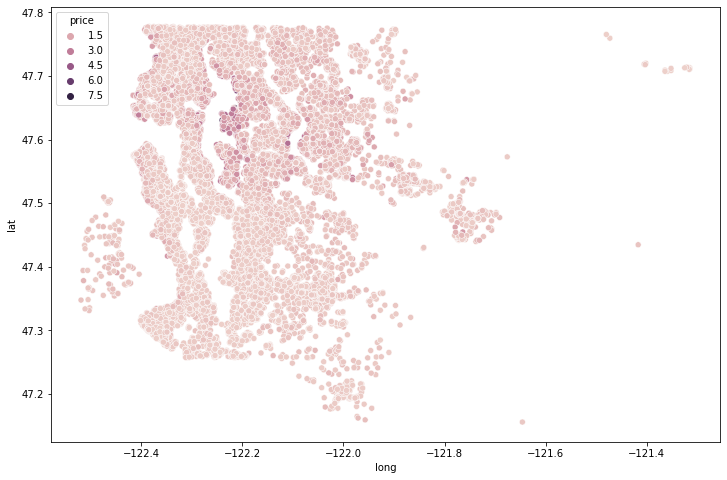

In [19]:
plt.figure(figsize=(12, 8))
sns.scatterplot(data=df, x='long', y='lat', hue='price')

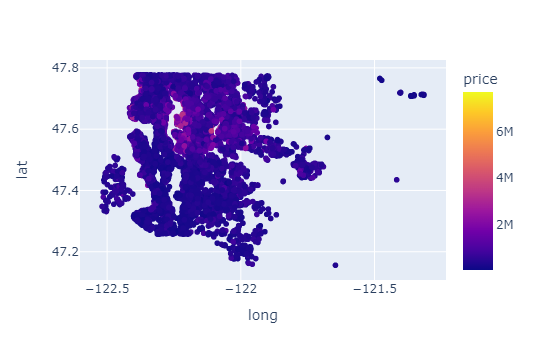

In [20]:
px.scatter(data_frame=df, x='long', y='lat', color='price')

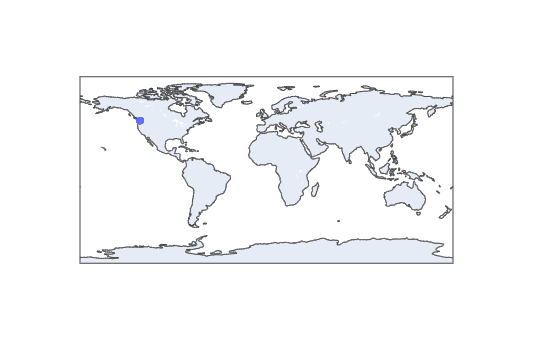

In [21]:
px.scatter_geo(data_frame=df, lat='lat', lon='long')

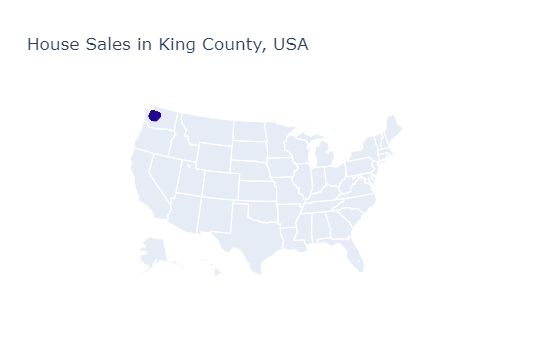

In [22]:
fig = go.Figure(data=go.Scattergeo(
    lon=df['long'],
    lat=df['lat'],
    mode='markers',
    marker_color=df['price']
))
fig.update_layout(
    title='House Sales in King County, USA',
    geo_scope='usa'
)
fig.show()

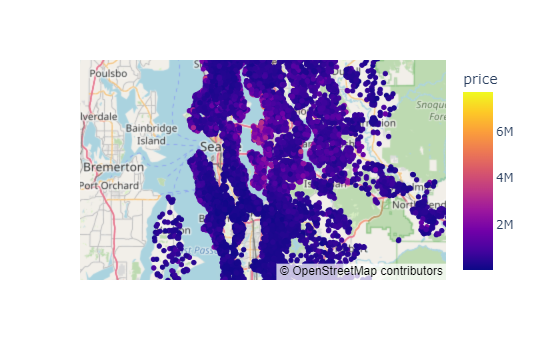

In [23]:
px.scatter_mapbox(
    data_frame=df,
    lat='lat',
    lon='long',
    color='price',
    mapbox_style='open-street-map',
    # mapbox_style='carto-positron',
    # width=700,
    # height=600
)

In [24]:
# Get top 20 most expensive houses
df.sort_values('price', ascending=False).head(20)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,6762700020,10/13/2014,7700000.0,6,8.00,12050,27600,2.5,0,3,...,13,8570,3480,1910,1987,98102,47.6298,-122.323,3940,8800
3910,9808700762,6/11/2014,7060000.0,5,4.50,10040,37325,2.0,1,2,...,11,7680,2360,1940,2001,98004,47.6500,-122.214,3930,25449
9245,9208900037,9/19/2014,6890000.0,6,7.75,9890,31374,2.0,0,4,...,13,8860,1030,2001,0,98039,47.6305,-122.240,4540,42730
4407,2470100110,8/4/2014,5570000.0,5,5.75,9200,35069,2.0,0,0,...,13,6200,3000,2001,0,98039,47.6289,-122.233,3560,24345
1446,8907500070,4/13/2015,5350000.0,5,5.00,8000,23985,2.0,0,4,...,12,6720,1280,2009,0,98004,47.6232,-122.220,4600,21750
1313,7558700030,4/13/2015,5300000.0,6,6.00,7390,24829,2.0,1,4,...,12,5000,2390,1991,0,98040,47.5631,-122.210,4320,24619
1162,1247600105,10/20/2014,5110000.0,5,5.25,8010,45517,2.0,1,4,...,12,5990,2020,1999,0,98033,47.6767,-122.211,3430,26788
8085,1924059029,6/17/2014,4670000.0,5,6.75,9640,13068,1.0,1,4,...,12,4820,4820,1983,2009,98040,47.5570,-122.210,3270,10454
2624,7738500731,8/15/2014,4500000.0,5,5.50,6640,40014,2.0,1,4,...,12,6350,290,2004,0,98155,47.7493,-122.280,3030,23408
8629,3835500195,6/18/2014,4490000.0,4,3.00,6430,27517,2.0,0,0,...,12,6430,0,2001,0,98004,47.6208,-122.219,3720,14592


In [25]:
# Calculate number of houses in 1% of the total houses
len(df)*(0.01)

215.97

In [26]:
# Extract a list of houses that are not in the 1% of the most expensive ones
non_top_1_perc = df.sort_values('price', ascending=False).iloc[216:]

<AxesSubplot:xlabel='long', ylabel='lat'>

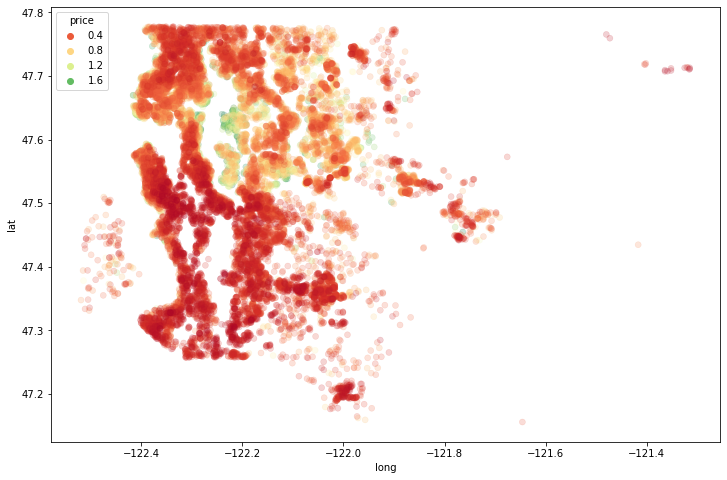

In [27]:
plt.figure(figsize=(12, 8))
sns.scatterplot(
    data=non_top_1_perc,
    x='long',
    y='lat',
    hue='price',
    palette='RdYlGn',
    edgecolor=None,
    alpha=0.2
)

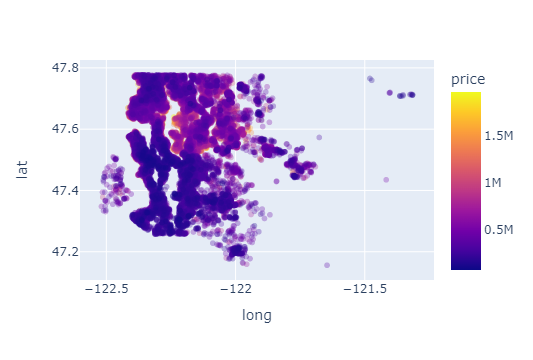

In [28]:
px.scatter(
    data_frame=non_top_1_perc,
    x='long',
    y='lat',
    color='price',
    opacity=0.3
)

### Other Features

<AxesSubplot:xlabel='waterfront', ylabel='price'>

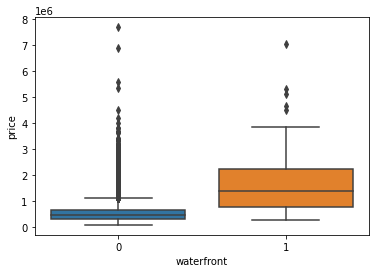

In [29]:
# Create a boxplot showing relationship between 'waterfront' and 'price'
sns.boxplot(data=df, x='waterfront', y='price')

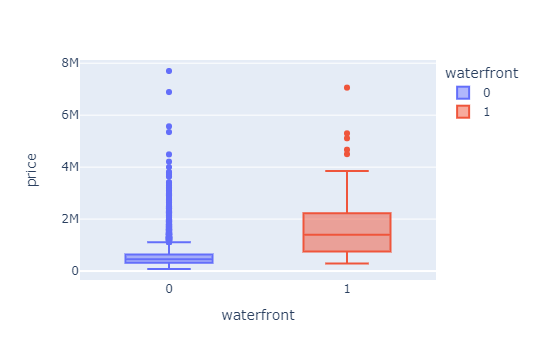

In [30]:
px.box(data_frame=df, x='waterfront', y='price', color='waterfront')